# README

* This code is runned on the google colab
* This notebooks use coordinate calculated by [this mehthod](https://drive.google.com/file/d/186FcnxoP_3KG3ZyD0OA_8AaTIsL2OAeX/view?usp=sharing) to find world coordinate

# How to run

Simply click `Runtime => run all`

# Import and Download

In [30]:
import numpy as np
import os
import cv2
import pandas as pd
from math import *
from glob import glob
from google.colab.patches import cv2_imshow

In [31]:
# ! rm -r /content/dataset

In [32]:
# download test folder
! git clone https://github.com/luoyaxiong/world_coordinate.git /content/dataset

fatal: destination path '/content/dataset' already exists and is not an empty directory.


"16949",F,"76982,82208,87434,92660",38,"1"

`16949_92660_20_0.jpg`

# Test image

## Load image

(1616, 2432, 3)


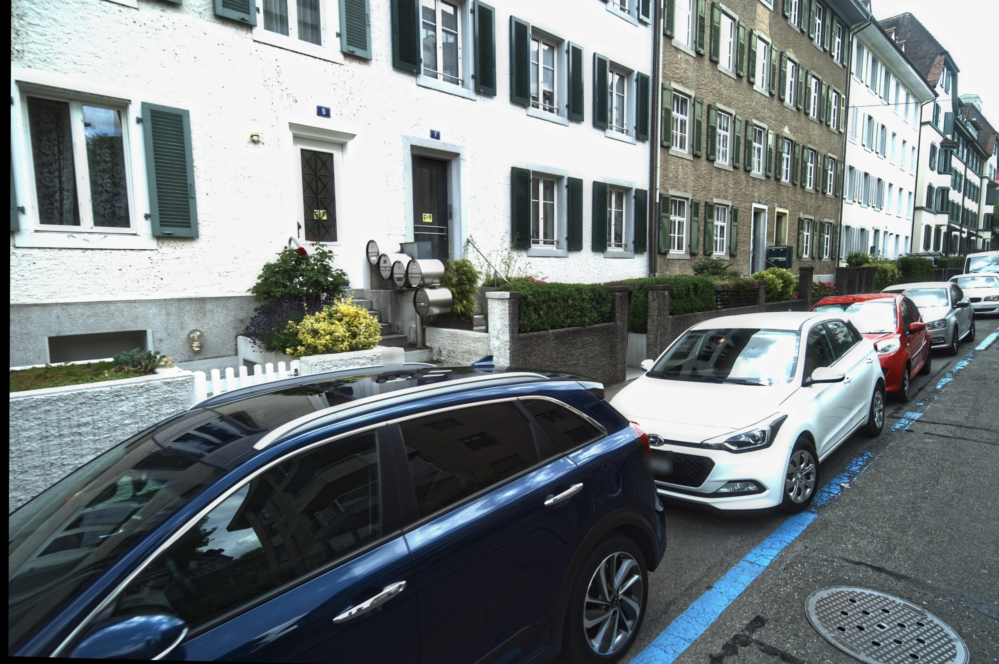

(1616, 2432, 3)


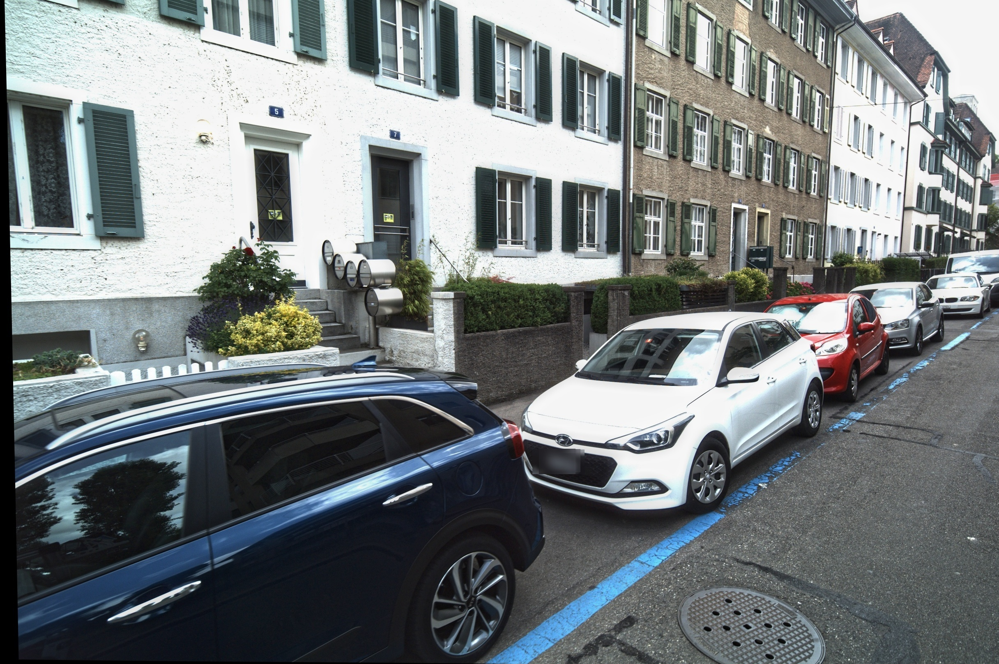

In [33]:
test_dir = '/content/dataset/depth_camera/'
list_imgs = sorted(glob(test_dir+"*.jpg")) 
for i, d in enumerate(list_imgs):
  im = cv2.imread(d)
  print(im.shape)
  cv2_imshow(im)

## Load meta data

Read data from .meta file

In [34]:
def read_meta(path):

  """
    Read parameters from meta file
  """
  
  for line in open(path, 'r'): 

    line=line.strip('\n')
    key = line.split(':')[0]
    val = line.split(':')[1]
    params = val.split(' ')

    if key == 'Sensor':
      c = float(val.split(' ')[-1])
    elif key == 'Orientation':
      x_0, y_0, z_0, omega, phi, kappa = float(params[1]),float(params[2]),float(params[3]),radians(float(params[4])),radians(float(params[5])),radians(float(params[6]))
      # x_0, y_0, z_0, omega, phi, kappa = float(params[1]),float(params[2]),float(params[3]),(float(params[4])),(float(params[5])),(float(params[6]))
    elif key == 'Image':
      p_i, w_i, h_i = float(params[1]),float(params[2]),float(params[3])
    elif key == 'DispMap':
      p_d, w_d, h_d, n, b = float(params[1]),float(params[2]),float(params[3]), float(params[4]), float(params[5])
    else:
      pass

  return x_0, y_0, z_0, omega, phi, kappa, p_i, w_i, h_i, c, p_d, w_d, h_d, n, b

# Load disparity image

In [35]:
def read_disparity_image(path,x_i, y_i, w_d, w_i, p_d, n, b):

  """
    read disparity image
  """
  img_dis = cv2.imread(path)
  b_channel, g_channel, r_channel = cv2.split(img_dis)
  d_map = r_channel*256+g_channel
  ratio = w_d/w_i
  x_d, y_d = int(x_i*ratio) , int(y_i*ratio)
  d_m = (65535*b) /(d_map[y_d, x_d]*n*p_d)

  return d_m

# Function to calculate the global coordinate

In [36]:
def calculate_coordinate(x_i, y_i, x_0, y_0, z_0, omega, phi, kappa, p_i, w_i, h_i, c, p_d, w_d, h_d, n, b, d_m):

  """
      Note: already convert omega, phi, kappa to radian value; unit of p_i is micrometer
      return: World coordinate (X,Y,Z) in the Swiss LV95 refrence system
  """

  unit = 1

  x_s = (x_i - w_i/2)*p_i*(unit)
  y_s = (h_i/2 - y_i)*p_i*(unit)

  X_s = np.mat(np.array([x_s, y_s, -c]).reshape(3,1))
  X_m = d_m*X_s
 
  r_list = [cos(phi)*cos(kappa)                                 , -cos(phi)*sin(kappa)                                , sin(phi)           ,
            cos(omega)*sin(kappa)+sin(omega)*sin(phi)*cos(kappa), cos(omega)*cos(kappa)-sin(omega)*sin(phi)*sin(kappa), -sin(omega)*cos(phi),
            sin(omega)*sin(kappa)-cos(omega)*sin(phi)*cos(kappa), sin(omega)*cos(kappa)+cos(omega)*sin(phi)*sin(kappa), cos(omega)*cos(phi)] 
  R = np.mat(np.array(r_list).reshape(3,3))

  X_0 = np.mat(np.array([x_0, y_0, z_0]).reshape(3,1))
  X_n = X_0+ R*X_m

  return np.array(X_n)

# Run the model

In [37]:
np.set_printoptions(suppress=True)

In [38]:
def distance(l_0, l_1):
  sum = 0
  for i in range(2):
    sum += (l_0[i]-l_1[i])**2
  return sqrt(sum)

In [39]:
def run_model(x_i, y_i, path_meta, path_dis):
  x_0, y_0, z_0, omega, phi, kappa, p_i, w_i, h_i, c, p_d, w_d, h_d, n, b = read_meta(path_meta)
  d_m = read_disparity_image(path_dis,x_i, y_i, w_d, w_i,p_d, n, b)
  coordinate = calculate_coordinate(x_i, y_i, x_0, y_0, z_0, omega, phi, kappa, p_i, w_i, h_i, c, p_d, w_d, h_d, n, b, d_m)
  return coordinate

## Test

In [40]:
dir = test_dir
list_meta = sorted(glob(test_dir+"*.meta")) 
path_meta = list_meta[0]
path_dis = sorted(glob(test_dir+"*.png")) [0]

In [41]:
# camera original point
x_0, y_0, z_0, omega, phi, kappa, p_i, w_i, h_i, c, p_d, w_d, h_d, n, b = read_meta(path_meta)
g_0 = np.array([x_0, y_0, z_0])

In [42]:
# test point 1
x_i, y_i = 2000,1500
g_1 = run_model(x_i, y_i, path_meta, path_dis)
g_1

array([[2612748.69523069],
       [1267174.34771398],
       [    254.59159887]])

In [43]:
# test point 2 
x_i, y_i = 1216,808
g_2 = run_model(x_i, y_i, path_meta, path_dis)
g_2

array([[2612749.64615833],
       [1267175.88901859],
       [    256.20923716]])

## Distance

In [44]:
dist_1 = distance(g_0, g_1)
dist_2 = distance(g_0, g_2)

In [45]:
print(f'Distance between original point and test point 1 is {dist_1}')
print(f'Distance between original point and test point 2 is {dist_2}')

Distance between original point and test point 1 is 1.810361386145471
Distance between original point and test point 2 is 0.006842064825576534
